## Capstone Project - The Battle of the Neighborhoods (Week 2)

### Applied Data Science Capstone by IBM/Coursera

### Opening a Restaurant in Toronto Neighborhood

**Introduction : Business Problem** 

The objective of this capstone project is to analyze and suggest the appropriate location for opening the restaurant and the type of the cuisine in order to run the restaurant successfully. The project will use the data science methodologies and approaches in order to provide the insight and suggestion to the business question: In the Toronto city, if a restauranteur wants to open the restaurant, where can restaurateur open the restaurant? hat category or cuisine can the restauranteur?

**Data** 

Based on definition of our problem, factors that will influence our decission are: 
- Population across the neighborhoods of Toronto
- List of restaurants available in the neighborhoods to understand the competition
- Ethnic group population change
- Average Income of the people in the neighborhoods

The following are the datasources used for retrieving the above informations
- **Data Source:** https://www12.statcan.gc.ca/census-recensement/2016/dp-pd/hlt-fst/pd-pl/Tables/CompFile.cfm?Lang=Eng&T=1201&OFT=FULLCSV **Description** The list contains the population (as on 2016) for each neighborhood for all the province of Canada. We have the geographic code, geographic name, province / territory and population (2016). Geographic code and geographic name contain the postal code.
- **Data Source:** https://en.wikipedia.org/wiki/Demographics_of_Toronto **Description:** The data set is extracted from the above source which lists the top 20 ethnic groups and their percentage of their contribution to the total population of Toronto for the years 2011 and 2016.
- **Data Source:** Foursquare API **Description:** The search endpoint of the foursquare API returns the list of the venues around the specified geospatial coordinate. It also provides the details like venue name, venue category, venue coordinates (latitude /longitude).
- **Data Source:** https://en.wikipedia.org/wiki/Demographics_of_Toronto_neighbourhoods **Description:** The dataset is obtained from the above source using the web scraping technique using the BeautifulSoup library. The Dataset has borough wise neighborhood data, their population, average salary, second top spoken language other than English. Since the language has strong relationship with the ethnicity, this information gives the largest ethnic group population in each neighborhood.

Import the libraries like Pandas for using and processing the data frames , BeautifulSoup for web scraping, Folium for dispalying the Maps.

In [1]:

#!pip3 install folium
#!pip3 install requests beautifulsoup4
from bs4 import BeautifulSoup
import pandas as pd
import requests
import folium

Get the postal codes, Boroughs, Neighborhoods details using the read_html method. The postal codes with unassigned boroughs are removed and only the valid Postal codes,Borough and neighbourhood are retrieved.

In [2]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
df_list = pd.read_html(url)
df_list[0].drop(df_list[0][df_list[0].Borough == 'Not assigned'].index, inplace =True)
print(df_list[0].shape)

(103, 3)


The geospatial coordinates of the neighborhood are retrieved using the Geospatial_coordinates.csv file. The postal code, latitude and longitude are selected from the csv file and the deatils are matched with the neighborhood dataframe using the postal code and merged into the single dataframe.

In [3]:
neigh_df = pd.DataFrame(df_list[0].Neighbourhood.str.split(',').to_list(), index=df_list[0]['Postal Code']).stack()
neigh_df = neigh_df.reset_index([0, 'Postal Code'])
neigh_df.columns = ['Postal Code', 'Neighbourhood']
neigh_df = pd.merge(neigh_df,df_list[0][['Postal Code','Borough']], on=['Postal Code'])
df_geo = pd.read_csv("https://cocl.us/Geospatial_data/Geospatial_Coordinates.csv")
df_Pos_Geo = pd.merge(neigh_df,
                 df_geo[['Postal Code', 'Latitude', 'Longitude']],
                 on='Postal Code')
df_Pos_Geo['Neighbourhood'] = df_Pos_Geo['Neighbourhood'].str.strip()
df_Pos_Geo.head()

,Postal Code,Neighbourhood,Borough,Latitude,Longitude
0,M3A,Parkwoods,North York,43.753259,-79.329656
1,M4A,Victoria Village,North York,43.725882,-79.315572
2,M5A,Regent Park,Downtown Toronto,43.654260,-79.360636
3,M5A,Harbourfront,Downtown Toronto,43.654260,-79.360636
4,M6A,Lawrence Manor,North York,43.718518,-79.464763


As the customers are the focal and driving parameter for the restaurant business,the population of the neighbourhood will help us to decide the location for opening the restaurant. The population of the Toronto's neighborhood as of 2016 is retrieved from the canada statistics site. The required fields like geographic code which corresponds to the postal code,province and ppulation columns are selected. The Ontario province details alone are filetered as we are focusing on the Toronto neighborhood. The population column is casted to float datatype. 

In [4]:
# fetch url 
url_pop = 'https://www12.statcan.gc.ca/census-recensement/2016/dp-pd/hlt-fst/pd-pl/Tables/CompFile.cfm?Lang=Eng&T=1201&OFT=FULLCSV'

# read into dataframe
pop = pd.read_csv(url_pop)


# drop irrelevant columns and make sure we are looking at Ontario
pop = pop[['Geographic code','Geographic name','Province or territory','Population, 2016']]
pop=pop[(pop['Province or territory']== "Ontario")]


# change population column type to float
pop['Population, 2016'].astype(float)

pop.head()

,Geographic code,Geographic name,Province or territory,"Population, 2016"
650,K0A,K0A,Ontario,103474.0
651,K0B,K0B,Ontario,20945.0
652,K0C,K0C,Ontario,52154.0
653,K0E,K0E,Ontario,38903.0
654,K0G,K0G,Ontario,37097.0


The Toronto neighborhood dataframe and the Population details are merged in to a single dataframe for using the same for further analysis.

In [5]:
df_Pos_Geo = pd.merge(df_Pos_Geo,pop[['Geographic code','Population, 2016']], left_on=['Postal Code'], right_on =['Geographic code'])
df_Pos_Geo=df_Pos_Geo[['Postal Code','Neighbourhood','Borough','Latitude','Longitude','Population, 2016']]
df_Pos_Geo.head()

,Postal Code,Neighbourhood,Borough,Latitude,Longitude,"Population, 2016"
0,M3A,Parkwoods,North York,43.753259,-79.329656,34615.0
1,M4A,Victoria Village,North York,43.725882,-79.315572,14443.0
2,M5A,Regent Park,Downtown Toronto,43.654260,-79.360636,41078.0
3,M5A,Harbourfront,Downtown Toronto,43.654260,-79.360636,41078.0
4,M6A,Lawrence Manor,North York,43.718518,-79.464763,21048.0


The cuisine of the new restaurant to be opened will be decided based on the major ethnic group population of Toronto. The demographics of Toronto provides the top 20 ethnic groups of Toronto and their population percent of the years 2011 and 2016.

In [6]:
table_data = pd.read_html("https://en.wikipedia.org/wiki/Demographics_of_Toronto")
len(table_data)
dt_Ethn= table_data[22].iloc[0:-1,[0,2]]
dt_Ethn.columns =['Ethnicity','2016']
df2=table_data[22].iloc[0:-1,[3,5]]
df2.columns =['Ethnicity','2011']
dt_Ethn=pd.merge(dt_Ethn,df2,on='Ethnicity',how='outer')
dt_Ethn.set_index('Ethnicity', inplace=True)
dt_Ethn.head()



,2016,2011
Ethnicity,,
Canadian,12.7,13.2
English,12.5,14.1
Chinese,12.0,10.8
East Indian,11.0,10.4
Irish,9.3,9.8


Compare the change in the population percentage of different ethnic groups for the years 2011 and 2016. The Chinese, East Indian, Pakistani, Sri Lankan ethnic groups show increase in the population percent in the year 2016 compared to 2011. So Chinese and Indian cuisine can be opted for new restaurant.We see the increase in the population of the following ethnic groups like Chinese (1.2%) , East Indian (0.6%) ,Pakistani (0.5%) ,Russian(0.3%), Sri Lankan (0.1%), Filipino (0.2%).

C:\Users\MEENA\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1373: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  return ax.bar(x, y, w, bottom=start, log=log, **kwds)


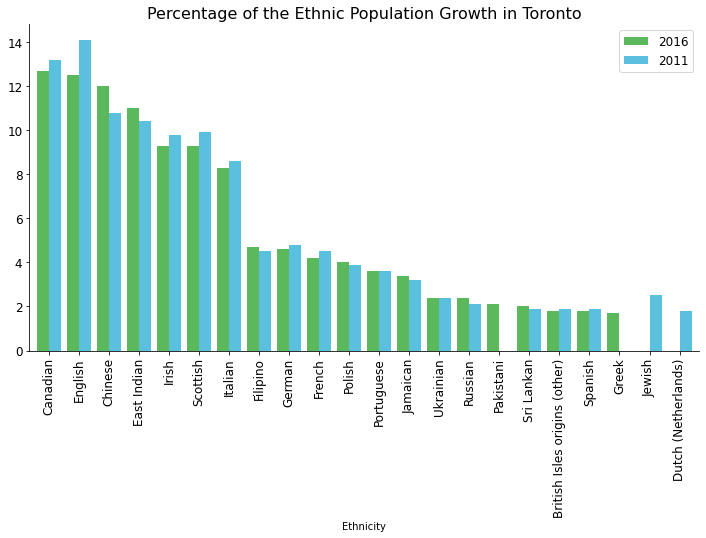

In [7]:
import matplotlib.pyplot as plt
colors=['#5cb85c','#5bc0de']
ax =dt_Ethn.plot(kind="bar",figsize=(12,6),width=0.8, color= colors,edgeColor=None)
ax.set_title("Percentage of the Ethnic Population Growth in Toronto",fontdict={ 'fontsize' :16})
ax.legend(fontsize =12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['right'].set_visible(False)
ax.get_yaxis().set_visible(True)

**Fouresquare**
Now that we have our location candidates, let's use Foursquare API to get info on restaurants in each neighborhood.The search endpoint of the Foursquare API is used to get the venue details like Venue name, venue category, venue location for each neighborhood. We are interested in getting the venues in and around 200m of the neighborhood. 

In [8]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 30
#Category ='4bf58dd8d48988d145941735' #Chinese
#Category ='4bf58dd8d48988d10f941735' # - indian


In [9]:
def getVenuesNeighbour (names, latitudes, longitudes,Category,radius =200):
    venues_list=[]
    for name , lat , lon  in zip(names,latitudes, longitudes):
        #print(name)
        url ='https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID,
            CLIENT_SECRET,
            VERSION,
            lat,
            lon,
            radius,
            LIMIT,
            Category
        )
        #print (url)
        results = requests.get(url).json()["response"]['venues']
        venues_list.append([(
            name, 
            lat, 
            lon, 
            v['name'], 
            v['location']['lat'], 
            v['location']['lng'],  
            v['categories'][0]['name']) for v in results])
        
        
        nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

All the food venues available in the neighborhood are retrieved.

In [10]:
#food venues

Toronto_all_Food_venues =getVenuesNeighbour(names=df_Pos_Geo['Neighbourhood'], latitudes=df_Pos_Geo['Latitude'], 
                                        longitudes=df_Pos_Geo['Longitude'],Category='4d4b7105d754a06374d81259')

In [11]:
#Chinese Food Venue
Toronto_Chinese_Food_venues =getVenuesNeighbour(names=df_Pos_Geo['Neighbourhood'], latitudes=df_Pos_Geo['Latitude'], 
                                        longitudes=df_Pos_Geo['Longitude'],Category='4bf58dd8d48988d145941735')

In [12]:
#Indian Food Venue
Toronto_Indian_Food_venues =getVenuesNeighbour(names=df_Pos_Geo['Neighbourhood'], latitudes=df_Pos_Geo['Latitude'], 
                                        longitudes=df_Pos_Geo['Longitude'],Category='4bf58dd8d48988d10f941735')

In [13]:
Toronto_food_venues=Toronto_Chinese_Food_venues.append(Toronto_Indian_Food_venues)

In [14]:
Toronto_food_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Regent Park,43.654260,-79.360636,Huayu Kitchen,43.654148,-79.357826,Chinese Restaurant
1,Harbourfront,43.654260,-79.360636,Huayu Kitchen,43.654148,-79.357826,Chinese Restaurant
2,Garden District,43.657162,-79.378937,Fine Asian Bowl,43.655387,-79.380326,Vietnamese Restaurant
3,Garden District,43.657162,-79.378937,Good View Chinese Restaurant,43.656791,-79.376139,Chinese Restaurant
4,Ryerson,43.657162,-79.378937,Fine Asian Bowl,43.655387,-79.380326,Vietnamese Restaurant


In [15]:
Toronto_all_Food_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Victoria Village,43.725882,-79.315572,Pizza Nova,43.725824,-79.312860,Pizza Place
1,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop
2,Victoria Village,43.725882,-79.315572,The Frig,43.727051,-79.317418,French Restaurant
3,Victoria Village,43.725882,-79.315572,Portugril,43.725819,-79.312785,Portuguese Restaurant
4,Victoria Village,43.725882,-79.315572,Wingburger,43.725580,-79.312851,Burger Joint


The choropleth map shows the population of each neighborhood in Toronto. The darker color represents the densely populated neighborhood and the lighter color diplays the least populated neighborhood. Densely populated neighborhoods are ideal for opening a new restaurant.The densely populated area has the population between 92,810 to 111,372 and the least populated has the population between 0 to 18,562. We observe that most of the neighborhoods are with average population ranging between 37,124 to 55,686.

In [16]:
import folium

response = requests.get("https://raw.githubusercontent.com/snehalatha82/Coursera_Capstone/main/Toronto_Map.json")

world_geo = response.json()
#print (world_geo)
# create a plain world map

world_map = folium.Map(location=[43.653,-79.3832], zoom_start=11)
choro =folium.Choropleth(
    geo_data =world_geo,
    data =pop,
    columns=['Geographic code','Population, 2016'],
    key_on='feature.properties.CFSAUID',
    fill_color ='YlOrRd',
    fill_opacity = 0.7,
    line_opacity=0.2,
    legend_name='Population in Toronto Neighborhood').add_to(world_map)

folium.LayerControl().add_to(world_map)


choro.geojson.add_child(folium.features.GeoJsonTooltip(['CFSAUID'],labels=False)
)

world_map

All the food venues in the neighborhood is plotted  on the choropleth map which compares the population vs Number of Food Venues. Neighborhoods with greater number of restaurant will be more competitive location whereas the neighborhoods with least number of population will be the ideal location for opening the restaurant.E.g. The densely populated **Willowdale** neighborhood and other averagely populated neighborhoods like **Rouge, West Humber – Clairville** etc doesn’t seem to have the restaurants, which will be the area or locations of focus for setting the restaurant.

In [17]:

for lat, lng, label in zip(Toronto_all_Food_venues['Neighborhood Latitude'], Toronto_all_Food_venues['Neighborhood Longitude'], Toronto_all_Food_venues['Venue Category']):
        #folium.Marker(
        #[lat, lng],   
        #popup =label,
    #).add_to(world_map)
        marker = folium.RegularPolygonMarker([lat,lng],
                                      popup=label,
                                      color='blue',
                                      opacity=0.7,
                                      weight=.3,
                                      fill_color='blue',
                                      fill_opacity=0.7,
                                      number_of_sides=3,
                                      radius=7)
        world_map.add_child(marker)

# show map
world_map

Since we decide the cuisine as the Chinese/Indian, we will cluster the Indian and Chinese restaurants based on the category and neighborhood. in order to cluster the data, the venue category which is categorical field, convert into binary using pandas get dummies function.

In [20]:
# one hot encoding
tor_onehot = pd.get_dummies(Toronto_food_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
tor_onehot['Neighborhood'] = Toronto_food_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [tor_onehot.columns[-1]] + list(tor_onehot.columns[:-1])
tor_onehot = tor_onehot[fixed_columns]

tor_onehot.head()


,Neighborhood,Asian Restaurant,Bubble Tea Shop,Chinese Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Fast Food Restaurant,Food Truck,Hakka Restaurant,Hotpot Restaurant,Indian Restaurant,Noodle House,North Indian Restaurant,Sushi Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Vietnamese Restaurant
0,Regent Park,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Harbourfront,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Garden District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,Garden District,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Ryerson,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [21]:

tor_grouped= tor_onehot.groupby('Neighborhood').mean().reset_index()

The other parameters driving the decision for opening the restaurant is the average income and the ethnic population of the neighborhood. The ethnicity is realted to the language spoken. so we get neighborhood name, their average income and  the percent of people speaking second common language in each neighborhood.

In [22]:
url="https://en.wikipedia.org/wiki/Demographics_of_Toronto_neighbourhoods"

# Make a GET request to fetch the raw HTML content
html_content = requests.get(url).text

# Parse the html content
soup = BeautifulSoup(html_content, "lxml")
#print(soup.prettify()) # print the parsed data of html



neigh_table = soup.find_all("table", attrs={"class": "wikitable"})
for i in (0,1,4):
    neigh_table_data = neigh_table[0].tbody.find_all("tr")  # contains 2 rows

    # Get all the headings of Lists
    headings = []
    for td in neigh_table_data[0].find_all("th"):
        # remove any newlines and extra spaces from left and right
        headings.append(td.text.replace('\n', ' ').strip())

    data = pd.DataFrame()
    for table, heading in zip(neigh_table, headings):
        table_data = []
        # Get headers of table 
        t_headers = []    
        for tr in table.tbody.find_all("tr"):#find all tr's from table's tbody 
            for th in tr.find_all("th"):            
                # remove any newlines and extra spaces from left and right
                t_headers.append(th.text.replace('\n', ' ').strip())
            t_row = {}
            # find all td's(3) in tr and zip it with t_header
            for td, th in zip(tr.find_all("td"), t_headers): 
                t_row[th] = td.text.replace('\n', '').strip()
            if  bool(t_row):
                table_data.append(t_row)
                #print(table_data)    
        data=data.append( table_data,ignore_index=True )
data.head()

,Name,FM,Census Tracts,Population,Land area (km2),Density (people/km2),% Change in Population since 2001,Average Income,Transit Commuting %,% Renters,Second most common language (after English) by name,Second most common language (after English) by percentage,Map
0,Crescent Town,EY,0190.01,"8,157",0.4,"20,393",-10.0,"23,021",24.5,20.3,Bengali (18.1%),18.1% Bengali,
1,Governor's Bridge/Bennington Heights,EY,0186.00,"2,112",1.87,1129,4.0,"129,904",7.1,13.3,Polish (1.4%),01.4% Polish,
2,Leaside,EY,"0195.00, 0196.00","13,876",2.81,4938,3.0,"82,670",9.7,10.5,Bulgarian (0.4%),00.4% Bulgarian,
3,O'Connor–Parkview,EY,"0189.00, 0190.02, 0191.00, 0192.00, 0193.00","17,740",4.94,3591,-6.1,"33,517",15.8,19.4,Urdu (3.2%),03.2% Urdu,
4,Old East York,EY,"0180.00, 0181.01, 0181.02, 0182.00, 0183.00, 0...","52,220",7.94,6577,-4.6,"33,172",22.0,19.1,Greek (4.3%),04.3% Greek,


The second common language and the percent of people speaking it is available as a single column  which cannot be used directly for analysis. so we will split the percent and language data and make them a two separate columns. The empty spaces in the language column and neighborhood name column are striped so that we can merge with neighborhood data for analysis. Since we have the population of the neighborhood and the percent of people speaking the second common language , we can calculate the population speaking the second common language.

In [23]:
fixed_column=['Name','Average Income']+[data.columns[-2]]
Neighwise_Avg_Income = data[fixed_column]
Neighwise_Avg_Income.columns =['Name','Average Income','Language1']
new_df = pd.DataFrame(Neighwise_Avg_Income.Name.str.split('/').to_list(), index=Neighwise_Avg_Income['Name']).stack()
new_df = new_df.reset_index([0, 'Name'])
new_df.columns = ['Name', 'b']
Neighwise_Avg_Income = pd.merge(Neighwise_Avg_Income, new_df, on=['Name'])
Neighwise_Avg_Income=Neighwise_Avg_Income[['Average Income','Language1','b']]
Neighwise_Avg_Income.columns =['Average Income','Language1','Name']
Neighwise_Avg_Income.head()
new_df = pd.DataFrame(Neighwise_Avg_Income.Language1.str.split(' ').to_list(), index=Neighwise_Avg_Income['Name'])
new_df = new_df.reset_index([0, 'Name'])
new_df.columns = ['Name', 'Percent','Language','b']
Neighwise_Avg_Income = pd.merge(Neighwise_Avg_Income, new_df, on=['Name'])

fixed_column=['Name','Average Income','Percent','Language']
Neighwise_Avg_Income=Neighwise_Avg_Income[fixed_column]
Neighwise_Avg_Income.head()

Neighwise_Avg_Income['Name']=Neighwise_Avg_Income['Name'].str.strip()
Neighwise_Avg_Income['Percent']=Neighwise_Avg_Income['Percent'].str.strip()
Neighwise_Avg_Income['Language']=Neighwise_Avg_Income['Language'].str.strip()

tor_neighbouhood=df_Pos_Geo
tor_neighbouhood=tor_neighbouhood.join(tor_grouped.set_index('Neighborhood'), on='Neighbourhood',how='left')
tor_neighbouhood =pd.merge(tor_neighbouhood,Neighwise_Avg_Income, left_on='Neighbourhood', right_on ='Name',how='left')
fixed_columns = list(tor_neighbouhood.columns[0:6])  + list(tor_neighbouhood.columns[-3:])
tor_neighbouhood = tor_neighbouhood[fixed_columns]
tor_neighbouhood.head()

tor_neighbouhood=tor_neighbouhood.replace({'Language':'Unspecified'},'Chinese')

tor_neighbouhood_data=tor_neighbouhood.dropna()

tor_neighbouhood_data['Percent']=tor_neighbouhood_data['Percent'].str.replace('%','')
tor_neighbouhood_data['Percent']=tor_neighbouhood_data['Percent'].astype(float)
tor_neighbouhood_data['lan_pop'] = tor_neighbouhood_data['Population, 2016']*tor_neighbouhood_data['Percent']/100

tor_neighbouhood_data.head()

<ipython-input-23-cfbfd9f7866c>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tor_neighbouhood_data['Percent']=tor_neighbouhood_data['Percent'].str.replace('%','')
<ipython-input-23-cfbfd9f7866c>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tor_neighbouhood_data['Percent']=tor_neighbouhood_data['Percent'].astype(float)
<ipython-input-23-cfbfd9f7866c>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Postal Code,Neighbourhood,Borough,Latitude,Longitude,"Population, 2016",Average Income,Percent,Language,lan_pop
0,M3A,Parkwoods,North York,43.753259,-79.329656,34615.0,"34,811",3.4,Chinese,1176.910
1,M4A,Victoria Village,North York,43.725882,-79.315572,14443.0,"29,657",3.2,Urdu,462.176
2,M5A,Regent Park,Downtown Toronto,43.654260,-79.360636,41078.0,"19,521",10.5,Bengali,4313.190
3,M5A,Harbourfront,Downtown Toronto,43.654260,-79.360636,41078.0,"69,232",2.4,Chinese,985.872
4,M6A,Lawrence Manor,North York,43.718518,-79.464763,21048.0,"36,361",7.2,Filipino,1515.456


Plot the average income on the choropleth. The green circles on the choropleth gives the magnitude of the average income across the neighborhoods. The scope for opening the restaurant in a neighborhood increases as the average income is more.From the plot we can easily come to know the average income of the neighborhoods without restaurant. E.g. **West Hill** doesn’t have a restaurant but have an average population and also the average income of 27,936

In [26]:

for lat, lng, label,Inc in zip(tor_neighbouhood_data['Latitude'], tor_neighbouhood_data['Longitude'], tor_neighbouhood_data['Neighbourhood'],tor_neighbouhood_data['Average Income']):
    folium.CircleMarker(
        [lat, lng],
        radius=int(Inc.replace(',',''))//10000,
        color='green',
        fill=True,
        popup=label+" Avg Inc "+Inc,
        fill_opacity=0.2
    ).add_to(world_map)

# show map
world_map

The top 30 highest spoken language in each neighborhood is plotted.The neighborhoods like **Milliken, Agincourt and Willowdale** are populated with **Cantonese** speaking people who are basically **Chinese** and **Rouge, Malvern and Morningside** are populated with **Tamil** people and **Thistletown** with **Punjabi** people. This majorly constitutes the **East Indian** population.

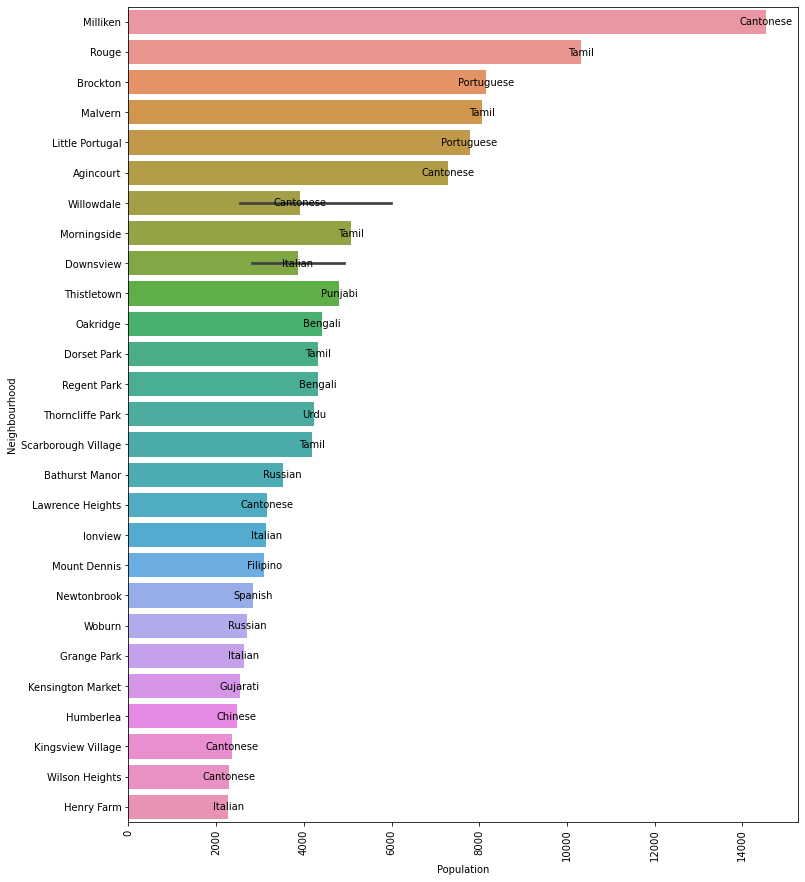

In [80]:
import seaborn as sns
t_final_data=tor_neighbouhood_data.sort_values(by='lan_pop', ascending=False).head(30)
t_final_data
fig, ax = plt.subplots()
fig.set_size_inches(12, 15)
sns.barplot(y="Neighbourhood", x="lan_pop",  data=t_final_data)
ax.tick_params(axis='x',rotation=90)
plt.xlabel('Population')
# here it's almost the same with your linked answer
rects = ax.patches
labels = t_final_data['Language'].values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width(), rect.get_y()+height/2 , label,
            ha='center', va='center')
plt.show()

In [31]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [32]:
import numpy as np
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = tor_grouped['Neighborhood']

for ind in np.arange(tor_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tor_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Adelaide,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Taiwanese Restaurant,Szechuan Restaurant,Sushi Restaurant,North Indian Restaurant,Noodle House,Hotpot Restaurant,Hakka Restaurant
1,Albion Gardens,Indian Restaurant,Vietnamese Restaurant,Taiwanese Restaurant,Szechuan Restaurant,Sushi Restaurant,North Indian Restaurant,Noodle House,Hotpot Restaurant,Hakka Restaurant,Food Truck
2,Beaumond Heights,Indian Restaurant,Vietnamese Restaurant,Taiwanese Restaurant,Szechuan Restaurant,Sushi Restaurant,North Indian Restaurant,Noodle House,Hotpot Restaurant,Hakka Restaurant,Food Truck
3,Bedford Park,Indian Restaurant,Vietnamese Restaurant,Taiwanese Restaurant,Szechuan Restaurant,Sushi Restaurant,North Indian Restaurant,Noodle House,Hotpot Restaurant,Hakka Restaurant,Food Truck
4,Cabbagetown,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Taiwanese Restaurant,Szechuan Restaurant,Sushi Restaurant,North Indian Restaurant,Noodle House,Hotpot Restaurant,Hakka Restaurant


We cluster the Indian and Chinese restaurant venues based on their location, category and identify the relationship between them. I used the **KMeans clustering** to cluster the venues. One of the trickier tasks in clustering is identifying the appropriate number of clusters k. We will use elbow method as a way to estimate the value k. For each k value, we will initialise k-means and use the inertia attribute to identify the **sum of squared distances** of samples to the nearest cluster centre.Sum of squared distances for k in the range is plotted and If the plot looks like an arm, then the elbow on the arm is optimal k.

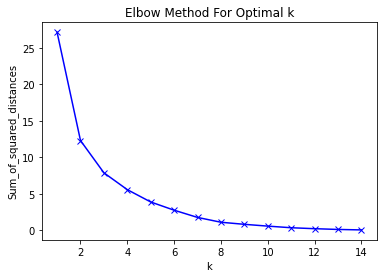

In [33]:
from sklearn.cluster import KMeans
import matplotlib.pyplot  as plt

tor_grouped_clustering = tor_grouped.drop('Neighborhood', 1)

Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k, max_iter=500, random_state =0)
    km = km.fit(tor_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In the plot above the elbow is at k=6 indicating the optimal k for this dataset is 6. Having identified the k=6, we cluster the Indian and Chinese restaurants based on the category and location into 6 clusters and plotted the cluster.

In [34]:
from sklearn.cluster import KMeans
# set number of clusters
kclusters = 6

#tor_grouped_clustering = tor_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(tor_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([4, 1, 1, 1, 4, 2, 1, 0, 4, 4])

In [35]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
tor_merged = df_Pos_Geo
# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
tor_merged = tor_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

tor_merged.head() # check the last columns!
tor_merged= tor_merged.dropna()


tor_Indo_Chin_Res =df_Pos_Geo
temp =tor_grouped
temp.insert(0, 'Cluster Labels', kmeans.labels_)
tor_Indo_Chin_Res=tor_Indo_Chin_Res.join(temp.set_index('Neighborhood'), on='Neighbourhood')
#tor_na_data = tor_Indo_Chin_Res[pd.isnull(tor_Indo_Chin_Res['Cluster Labels'])]
tor_Indo_Chin_Res=tor_Indo_Chin_Res.dropna()


Review the dataframe using the cluster labels

In [36]:
tor_Indo_Chin_Res[tor_Indo_Chin_Res['Cluster Labels']==0].groupby(['Postal Code','Neighbourhood']).max()
#chinese

Borough   Latitude  Longitude  \
Postal Code Neighbourhood                                                     
M1W         L'Amoreaux West               Scarborough  43.799525 -79.318389   
            Steeles West                  Scarborough  43.799525 -79.318389   
M4V         Deer Park                 Central Toronto  43.686412 -79.400049   
            Forest Hill SE            Central Toronto  43.686412 -79.400049   
            Rathnelly                 Central Toronto  43.686412 -79.400049   
            South Hill                Central Toronto  43.686412 -79.400049   
            Summerhill West           Central Toronto  43.686412 -79.400049   
M5A         Harbourfront             Downtown Toronto  43.654260 -79.360636   
            Regent Park              Downtown Toronto  43.654260 -79.360636   
M5K         Design Exchange          Downtown Toronto  43.647177 -79.381576   
            Toronto Dominion Centre  Downtown Toronto  43.647177 -79.381576   
M5R         North Midtown             Central Toronto  43.672710 -79.405678   
            The Annex                 Central Toronto  43.672710 -79.405678   
            Yorkville                 Central Toronto  43.672710 -79.405678   
M5T         Chinatown                Downtown Toronto  43.653206 -79.400049   
            Grange Park              Downtown Toronto  43.653206 -79.400049   
            Kensington Market        Downtown Toronto  43.653206 -79.400049   
M5W         Stn A PO Boxes           Downtown Toronto  43.646435 -79.374846   

                                     Population, 2016  Cluster Labels  \
Postal Code Neighbourhood                                               
M1W         L'Amoreaux West                   48471.0             0.0   
            Steeles West                      48471.0             0.0   
M4V         Deer Park                         18241.0             0.0   
            Forest Hill SE                    18241.0             0.0   
            Rathnelly                         18241.0             0.0   
            South Hill                        18241.0             0.0   
            Summerhill West                   18241.0             0.0   
M5A         Harbourfront                      41078.0             0.0   
            Regent Park                       41078.0             0.0   
M5K         Design Exchange                       0.0             0.0   
            Toronto Dominion Centre               0.0             0.0   
M5R         North Midtown                     26496.0             0.0   
            The Annex                         26496.0             0.0   
            Yorkville                         26496.0             0.0   
M5T         Chinatown                         17748.0             0.0   
            Grange Park                       17748.0             0.0   
            Kensington Market                 17748.0             0.0   
M5W         Stn A PO Boxes                       15.0             0.0   

                                     Asian Restaurant  Bubble Tea Shop  \
Postal Code Neighbourhood                                                
M1W         L'Amoreaux West                  0.000000         0.000000   
            Steeles West                     0.000000         0.000000   
M4V         Deer Park                        0.000000         0.000000   
            Forest Hill SE                   0.000000         0.000000   
            Rathnelly                        0.000000         0.000000   
            South Hill                       0.000000         0.000000   
            Summerhill West                  0.000000         0.000000   
M5A         Harbourfront                     0.000000         0.000000   
            Regent Park                      0.000000         0.000000   
M5K         Design Exchange                  0.142857         0.000000   
            Toronto Dominion Centre          0.142857         0.000000   
M5R         North Midtown                 

In [37]:
tor_Indo_Chin_Res[tor_Indo_Chin_Res['Cluster Labels']==1].groupby(['Postal Code','Neighbourhood']).max()
#Indian

Borough   Latitude  Longitude  \
Postal Code Neighbourhood                                                 
M4H         Thorncliffe Park            East York  43.705369 -79.349372   
M4K         Riverdale                East Toronto  43.679557 -79.352188   
            The Danforth West        East Toronto  43.679557 -79.352188   
M4S         Davisville            Central Toronto  43.704324 -79.388790   
M5G         Central Bay Street   Downtown Toronto  43.657952 -79.387383   
M5J         Harbourfront East    Downtown Toronto  43.640816 -79.381752   
            Toronto Islands      Downtown Toronto  43.640816 -79.381752   
            Union Station        Downtown Toronto  43.640816 -79.381752   
M5M         Bedford Park               North York  43.733283 -79.419750   
            Lawrence Manor East        North York  43.733283 -79.419750   
M6J         Little Portugal          West Toronto  43.647927 -79.419750   
            Trinity                  West Toronto  43.647927 -79.419750   
M9V         Albion Gardens              Etobicoke  43.739416 -79.588437   
            Beaumond Heights            Etobicoke  43.739416 -79.588437   
            Humbergate                  Etobicoke  43.739416 -79.588437   
            Jamestown                   Etobicoke  43.739416 -79.588437   
            Mount Olive                 Etobicoke  43.739416 -79.588437   
            Silverstone                 Etobicoke  43.739416 -79.588437   
            South Steeles               Etobicoke  43.739416 -79.588437   
            Thistletown                 Etobicoke  43.739416 -79.588437   

                                 Population, 2016  Cluster Labels  \
Postal Code Neighbourhood                                           
M4H         Thorncliffe Park              19688.0             1.0   
M4K         Riverdale                     31583.0             1.0   
            The Danforth West             31583.0             1.0   
M4S         Davisville                    26506.0             1.0   
M5G         Central Bay Street             8423.0             1.0   
M5J         Harbourfront East             14545.0             1.0   
            Toronto Islands               14545.0             1.0   
            Union Station                 14545.0             1.0   
M5M         Bedford Park                  25975.0             1.0   
            Lawrence Manor East           25975.0             1.0   
M6J         Little Portugal               32684.0             1.0   
            Trinity                       32684.0             1.0   
M9V         Albion Gardens                55959.0             1.0   
            Beaumond Heights              55959.0             1.0   
            Humbergate                    55959.0             1.0   
            Jamestown                     55959.0             1.0   
            Mount Olive                   55959.0             1.0   
            Silverstone                   55959.0             1.0   
            South Steeles                 55959.0             1.0   
            Thistletown                   55959.0             1.0   

                                 Asian Restaurant  Bubble Tea Shop  \
Postal Code Neighbourhood                                            
M4H         Thorncliffe Park                  0.0              0.0   
M4K         Riverdale                         0.0              0.0   
            The Danforth West                 0.0              0.0   
M4S         Davisville                        0.0              0.0   
M5G         Central Bay Street                0.0              0.0   
M5J         Harbourfront East                 0.0              0.0   
            Toronto Islands                   0.0              0.0   
            Union Station                     0.0              0.0   
M5M         Bedford Park                      0.0              0.0   
            Lawrence Manor East               0.0              0.0   
M6J         Little Portugal     

In [38]:
tor_Indo_Chin_Res[tor_Indo_Chin_Res['Cluster Labels']==2].groupby(['Postal Code','Neighbourhood']).max()
#Hakka

,,Borough,Latitude,Longitude,"Population, 2016",Cluster Labels,Asian Restaurant,Bubble Tea Shop,Chinese Restaurant,Dim Sum Restaurant,Dumpling Restaurant,...,Food Truck,Hakka Restaurant,Hotpot Restaurant,Indian Restaurant,Noodle House,North Indian Restaurant,Sushi Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Vietnamese Restaurant
Postal Code,Neighbourhood,,,,,,,,,,,,,,,,,,,,,
M1H,Cedarbrae,Scarborough,43.773136,-79.239476,24383.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
M4M,Studio District,East Toronto,43.659526,-79.340923,24689.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
tor_Indo_Chin_Res[tor_Indo_Chin_Res['Cluster Labels']==3].groupby(['Postal Code','Neighbourhood']).max()
#Dim Sum

Borough   Latitude  Longitude  Population, 2016  \
Postal Code Neighbourhood                                                       
M2J         Fairview       North York  43.778517 -79.346556           58293.0   
            Henry Farm     North York  43.778517 -79.346556           58293.0   
            Oriole         North York  43.778517 -79.346556           58293.0   
M3B         Don Mills      North York  43.745906 -79.352188           13324.0   
M3C         Don Mills      North York  43.725900 -79.340923           39153.0   

                           Cluster Labels  Asian Restaurant  Bubble Tea Shop  \
Postal Code Neighbourhood                                                      
M2J         Fairview                  3.0               0.0              0.0   
            Henry Farm                3.0               0.0              0.0   
            Oriole                    3.0               0.0              0.0   
M3B         Don Mills                 3.0               0.0              0.0   
M3C         Don Mills                 3.0               0.0              0.0   

                           Chinese Restaurant  Dim Sum Restaurant  \
Postal Code Neighbourhood                                           
M2J         Fairview                      0.0                 1.0   
            Henry Farm                    0.0                 1.0   
            Oriole                        0.0                 1.0   
M3B         Don Mills                     0.5                 0.5   
M3C         Don Mills                     0.5                 0.5   

                           Dumpling Restaurant  ...  Food Truck  \
Postal Code Neighbourhood                       ...               
M2J         Fairview                       0.0  ...         0.0   
            Henry Farm                     0.0  ...         0.0   
            Oriole                         0.0  ...         0.0   
M3B         Don Mills                      0.0  ...         0.0   
M3C         Don Mills                      0.0  ...         0.0   

                           Hakka Restaurant  Hotpot Restaurant  \
Postal Code Neighbourhood                                        
M2J         Fairview                    0.0                0.0   
            Henry Farm                  0.0                0.0   
            Oriole                      0.0                0.0   
M3B         Don Mills                   0.0                0.0   
M3C         Don Mills                   0.0                0.0   

                           Indian Restaurant  Noodle House  \
Postal Code Neighbourhood                                    
M2J         Fairview                     0.0           0.0   
            Henry Farm                   0.0           0.0   
            Oriole                       0.0           0.0   
M3B         Don Mills                    0.0           0.0   
M3C         Don Mills                    0.0           0.0   

                           North Indian Restaurant  Sushi Restaurant  \
Postal Code Neighbourhood                                              
M2J         Fairview                           0.0               0.0   
            Henry Farm                         0.0               0.0   
            Oriole                             0.0               0.0   
M3B         Don Mills                          0.0               0.0   
M3C         Don Mills                          0.0               0.0   

                           Szechuan Restaurant  Taiwanese Restaurant  \
Postal Code Neighbourhood                                              
M2J         Fairview                       0.0                   0.0   
            Henry Farm                     0.0                   0.0   
            Oriole                         0.0                   0.0   
M3B         Don Mills                      0.0                   0.0   
M3C         Don Mills                      0.0                   0.0   

                           Vietnamese R

In [40]:
tor_Indo_Chin_Res[tor_Indo_Chin_Res['Cluster Labels']==4].groupby(['Postal Code','Neighbourhood']).max()
#Indian - Chinese

Borough   Latitude  Longitude  \
Postal Code Neighbourhood                                                  
M4X         Cabbagetown           Downtown Toronto  43.667967 -79.367675   
            St. James Town        Downtown Toronto  43.667967 -79.367675   
M4Y         Church and Wellesley  Downtown Toronto  43.665860 -79.383160   
M5B         Garden District       Downtown Toronto  43.657162 -79.378937   
            Ryerson               Downtown Toronto  43.657162 -79.378937   
M5C         St. James Town        Downtown Toronto  43.651494 -79.375418   
M5H         Adelaide              Downtown Toronto  43.650571 -79.384568   
            King                  Downtown Toronto  43.650571 -79.384568   
            Richmond              Downtown Toronto  43.650571 -79.384568   
M5L         Commerce Court        Downtown Toronto  43.648198 -79.379817   
            Victoria Hotel        Downtown Toronto  43.648198 -79.379817   
M5X         First Canadian Place  Downtown Toronto  43.648429 -79.382280   
            Underground city      Downtown Toronto  43.648429 -79.382280   

                                  Population, 2016  Cluster Labels  \
Postal Code Neighbourhood                                            
M4X         Cabbagetown                    20822.0             4.0   
            St. James Town                 20822.0             4.0   
M4Y         Church and Wellesley           30472.0             4.0   
M5B         Garden District                12785.0             4.0   
            Ryerson                        12785.0             4.0   
M5C         St. James Town                  2951.0             4.0   
M5H         Adelaide                        2005.0             4.0   
            King                            2005.0             4.0   
            Richmond                        2005.0             4.0   
M5L         Commerce Court                     0.0             4.0   
            Victoria Hotel                     0.0             4.0   
M5X         First Canadian Place              10.0             4.0   
            Underground city                  10.0             4.0   

                                  Asian Restaurant  Bubble Tea Shop  \
Postal Code Neighbourhood                                             
M4X         Cabbagetown                   0.000000              0.0   
            St. James Town                0.000000              0.0   
M4Y         Church and Wellesley          0.000000              0.0   
M5B         Garden District               0.000000              0.0   
            Ryerson                       0.000000              0.0   
M5C         St. James Town                0.000000              0.0   
M5H         Adelaide                      0.000000              0.0   
            King                          0.000000              0.0   
            Richmond                      0.000000              0.0   
M5L         Commerce Court                0.000000              0.0   
            Victoria Hotel                0.000000              0.0   
M5X         First Canadian Place          0.111111              0.0   
            Underground city              0.111111              0.0   

                                  Chinese Restaurant  Dim Sum Restaurant  \
Postal Code Neighbourhood                                                  
M4X         Cabbagetown                     0.333333                 0.0   
            St. James Town                  0.333333                 0.0   
M4Y         Church and Wellesley            0.250000                 0.0   
M5B         Garden District                 0.142857                 0.0   
            Ryerson                         0.142857                 0.0   
M5C         St. James Town                  0.333333                 0.0   
M5H         Adelaide                        0.400000                 0.0   
            King                            0.400000                 0.0   
            Richmond     

In [41]:
tor_Indo_Chin_Res[tor_Indo_Chin_Res['Cluster Labels']==5].groupby(['Postal Code','Neighbourhood']).max()
#food truck

Borough   Latitude  Longitude  \
Postal Code Neighbourhood                                                   
M5S         Harbord                Downtown Toronto  43.662696 -79.400049   
            University of Toronto  Downtown Toronto  43.662696 -79.400049   

                                   Population, 2016  Cluster Labels  \
Postal Code Neighbourhood                                             
M5S         Harbord                         15372.0             5.0   
            University of Toronto           15372.0             5.0   

                                   Asian Restaurant  Bubble Tea Shop  \
Postal Code Neighbourhood                                              
M5S         Harbord                             0.0              0.0   
            University of Toronto               0.0              0.0   

                                   Chinese Restaurant  Dim Sum Restaurant  \
Postal Code Neighbourhood                                                   
M5S         Harbord                              0.25                 0.0   
            University of Toronto                0.25                 0.0   

                                   Dumpling Restaurant  ...  Food Truck  \
Postal Code Neighbourhood                               ...               
M5S         Harbord                                0.0  ...        0.75   
            University of Toronto                  0.0  ...        0.75   

                                   Hakka Restaurant  Hotpot Restaurant  \
Postal Code Neighbourhood                                                
M5S         Harbord                             0.0                0.0   
            University of Toronto               0.0                0.0   

                                   Indian Restaurant  Noodle House  \
Postal Code Neighbourhood                                            
M5S         Harbord                              0.0           0.0   
            University of Toronto                0.0           0.0   

                                   North Indian Restaurant  Sushi Restaurant  \
Postal Code Neighbourhood                                                      
M5S         Harbord                                    0.0               0.0   
            University of Toronto                      0.0               0.0   

                                   Szechuan Restaurant  Taiwanese Restaurant  \
Postal Code Neighbourhood                                                      
M5S         Harbord                                0.0                   0.0   
            University of Toronto                  0.0                   0.0   

                                   Vietnamese Restaurant  
Postal Code Neighbourhood                                 
M5S         Harbord                                  0.0  
            University of Toronto                    0.0  

[2 rows x 21 columns]

In [42]:
#clusters ={'CluserNo':[0,1,2,3,4],'ClusterDesc':['Chinese Restaurants','Indian Restaurants','DimSum Restaurant','Indian-Chinese Resataurant','Food Truck']}
clusters ={'ClusterDesc':['Chinese Restaurants','Indian Restaurants','Hakka Restaurants','DimSum Restaurants','Indian-Chinese Resataurants','Food Truck']}
df_cluster =pd.DataFrame(clusters,columns =['ClusterDesc'])
df_cluster

,ClusterDesc
0,Chinese Restaurants
1,Indian Restaurants
2,Hakka Restaurants
3,DimSum Restaurants
4,Indian-Chinese Resataurants
5,Food Truck


The cluster details are plotted on the choropleth

In [43]:
#!pip install folium
#!pip install geopy
import folium
from geopy.geocoders import Nominatim
import matplotlib.cm as cm
import matplotlib.colors as colors

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]



# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tor_Indo_Chin_Res['Latitude'], tor_Indo_Chin_Res['Longitude'], tor_Indo_Chin_Res['Neighbourhood'], tor_Indo_Chin_Res['Cluster Labels'].astype(int)):
    label = folium.Popup(str(poi) + ' Cluster - ' + df_cluster.iloc[cluster]['ClusterDesc'], parse_html=True)    
    folium.RegularPolygonMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7,
        number_of_sides=6
    ).add_to(world_map)
       
world_map

In the figure, we have 6 clusters plotted as the hexagon marker. 
- **Cluster 1:** Red colour hexagon showing the clusters with a greater number of Chinese restaurants. 
- **Cluster 2:** Purple colour hexagon showing the clusters with a greater number of Indian restaurants. 
- **Cluster 3:** Light Green colour hexagon showing the cluster with 65% of Indian restaurants and 35% of Chinese restaurants. 
- **Cluster 4:** Light Blue colour hexagon showing the cluster with a greater number of Hakka restaurants. 
- **Cluster 5:** Cyan colour hexagon showing the cluster with a greater number of Dim Sum restaurants. 
- **Cluster 6:** Cyan colour hexagon showing the cluster with a greater number of food trucks.

**Results & Discussion:**

The following are the observations after analysing the data. 
1. The most popular ethnic groups in the neighbourhoods in Toronto are **Chinese, East Indian, Pakistani and Sri Lankan**. **Chinese and Indian Restaurants** will be the ideal choice of cuisine.
2. The most populous neighborhood in Toronto is **Willowdale** which does not have any restaurants and it has the **average income of 39,895**. Also, it has more **Cantonese speaking population** who belong to Chinese ethnic group. So, it will be the ideal location for opening the Chinese restaurant.
3. The other neighborhoods for opening the **Chinese restaurants** are **Agincourt and Milliken** with more Cantonese speaking population and average income of 25,750 and 25,243 respectively.
4. South Indian cuisine restaurant can be opened in the neighborhoods like **Rouge and Morning side**, which have more Tamil speaking population with the average income of 29,230 and 27,936 respectively.

Apart from the above observations, we have the **cluster 5** which has a greater number of **Dim Sum restaurants** located mainly around **Don Mills, Oriole/Henry farm** neighborhood. Those neighborhoods have more Chinese and Mandarin speaking population and Restaurateur can open a Chinese restaurant. In the **Oakridge and Scarborough Village West** neighborhoods has **Bengali and Tamil** speaking population respectively and can be considered for opening the **Indian restaurant** which can server both North and South Indian dishes. If the Restaurateur plans to open the Chinese cuisine restaurant, he/she should avoid the neighborhoods in the **cluster 1 and cluster 3** which already have a greater number of the Chinese restaurants and competitors.

**Conclusion:**

Purpose of this project was to identify the neighborhoods of Toronto and the cuisine in order to aid stakeholders in narrowing down the search for optimal location for a new restaurant. By calculating restaurant density distribution from Foursquare data, we have first identified general neighborhoods that justify further analysis (Willowdale, Rouge), and then done extensive analysis of the ethnic population and average income of the neighborhoods. The Chinese and the Indian cuisine are selected based on the above analysis. Clustering of Indian and Chinese restaurants was then performed in order to group the restaurants based on the category inorder to make recommendations.
Final decision on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like ethnic population, average income.


**Suggestions for future research:**

We have considered the population, trend in the change of ethnic group population and average income of the neighborhoods for analyzing and decide for the ideal location for opening the restaurateur. Other parameters also impact the business like the Tourist attractions in the neighborhood which attracts the domestic and foreign visitors, Age wise population which also have major impact on opening the chain of restaurants, Ratings of the existing restaurants to know the popularity of each restaurant which in turn helps to know the potential competitors. Also, we have to include the Business centers, work premises which also attract many customers towards the restaurants. All the above stated parameters may help in further precise analysis.
